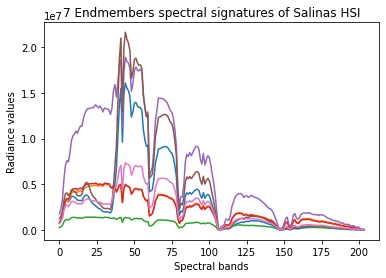

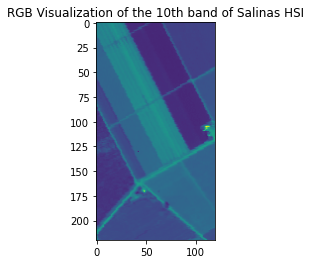

In [57]:
import scipy.io as sio
import numpy as np
import scipy.optimize 
import matplotlib.pyplot as plt
Salinas = sio.loadmat('Salinas_cube.mat')
HSI = Salinas['salinas_cube'] #Salinas HSI : 220x120x204

ends = sio.loadmat('Salinas_endmembers.mat') # Endmember's matrix: 204x7
endmembers = ends['salinas_endmembers']
fig = plt.figure()
plt.plot(endmembers)
plt.ylabel('Radiance values')
plt.xlabel('Spectral bands')
plt.title('7 Endmembers spectral signatures of Salinas HSI')
plt.show()

#Perform unmixing for the pixels corresponding to nonzero labels
ground_truth= sio.loadmat('Salinas_gt.mat')
labels=ground_truth['salinas_gt']

fig = plt.figure()
plt.imshow(HSI[:,:,10])
plt.title('RGB Visualization of the 10th band of Salinas HSI')
plt.show()
# For the non-negative least squares  unmixing algorithm  you can use the nnls function, see the following link:
#https://docs.scipy.org/doc/scipy-0.18.1/reference/generated/scipy.optimize.nnls.html#scipy.optimize.nnls
# ..............
#
#..................

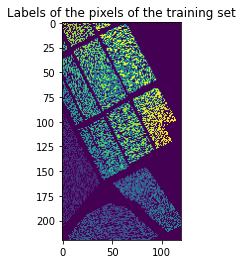

In [58]:
# Trainining set for classification 
Salinas_labels = sio.loadmat('classification_labels_Salinas.mat')
Training_Set = (np.reshape(Salinas_labels['training_set'],(120,220))).T
Test_Set = (np.reshape(Salinas_labels['test_set'],(120,220))).T
Operational_Set = (np.reshape(Salinas_labels['operational_set'],(120,220))).T

fig = plt.figure()
plt.imshow(Training_Set)
plt.title('Labels of the pixels of the training set')
plt.show()

Part 1 (spectral unmixing)

(A)

(a) Least squares (as it was presented in the class)

In [59]:
M = HSI.shape[0] 
N = HSI.shape[1]
L = HSI.shape[2]
pixels= M*N

X=endmembers
y=HSI.reshape((pixels,L)).T

#Calculate the theta
thetaA=[]
for i in range(pixels):
    thetaA.append(np.dot(np.linalg.inv(np.dot(X.T,X)),np.dot(X.T,y[:,i])))
thetaA=np.array(thetaA).T

(i) Derive the corresponding 7 abundance maps (one for each
endmember/material)

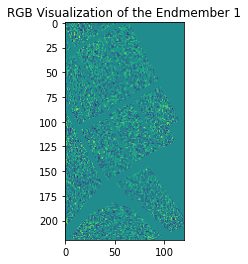

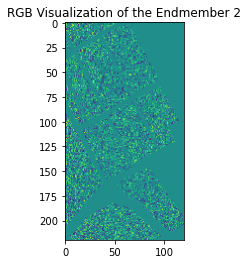

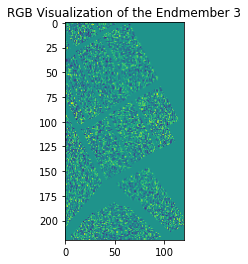

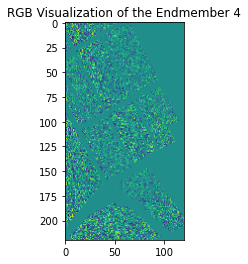

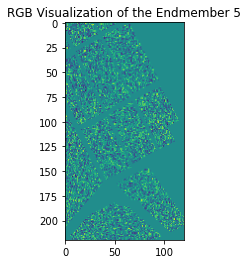

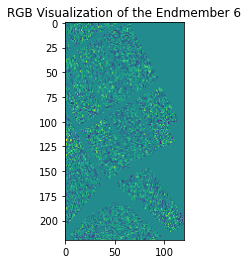

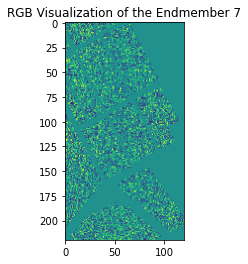

In [60]:
#Define function for abudance maps
def abudance_maps(theta):
    yreshaped=y.reshape((204,220,120))
    thetareshaped=theta.reshape((7,220,120))
    abudance=np.zeros((220,120,7))
    for i in range(220):
        for j in range(120):
            if labels[i,j]!=0:
                for m in range(7):
                    abudance[i,j,m]=thetareshaped[m,i,j]
    return abudance

#Calculate the abudance maps
abudanceA=abudance_maps(thetaA)

#PLot the abudance maps
for i in range(7):
    fig=plt.figure()
    plt.imshow(abudanceA[:,:,i])
    plt.title('RGB Visualization of the Endmember '+str(i+1))
    plt.show()

(ii) Compute the reconstruction error (for each (non-zero class label) pixel yi
compute the quantity ||𝒚𝑖 − 𝑋𝜽𝑖
||
2
and then take the average over those pixels).

In [62]:
#Define reconstruction error function
def recon_error(theta):
    yreshaped=y.reshape((204,220,120))
    thetareshaped=theta.reshape((7,220,120))
    error=[]
    for i in range(220):
        for j in range(120):
            if labels[i,j]!=0:
                reconerror=(np.linalg.norm(yreshaped[:,i,j]-np.dot(X,thetareshaped[:,i,j])))**2
                error.append(reconerror)
    error=np.array(error)
    return error

#Calculate reconstruction error
errorA=recon_error(thetaA)
print('The reconstruction error is ',round(np.mean(errorA)))

The reconstruction error is  14472736323676924


(b) Least squares imposing the sum-to-one constraint

In [63]:
from scipy.optimize import minimize

#Define the function that needs to be minimized
def ls(x,a,b):
    return np.linalg.norm(a.dot(x)-b)

#Define the constraint (sum to one)
cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x)-1})

#Calculate theta
thetaB=[]
for i in range(pixels):
    thetaB.append(minimize(ls,args=(X,y[:,i]) ,x0=theta[:,0],constraints=cons).x)
thetaB=np.array(thetaB).T

(i) Derive the corresponding 7 abundance maps (one for each endmember/material)

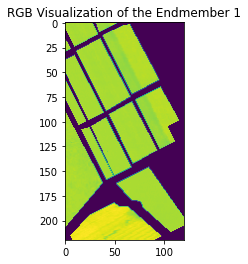

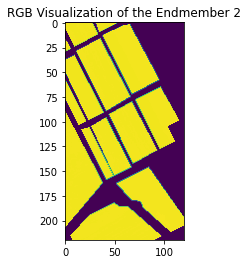

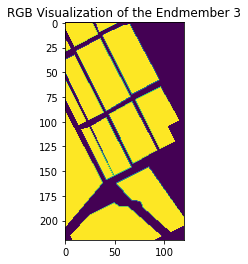

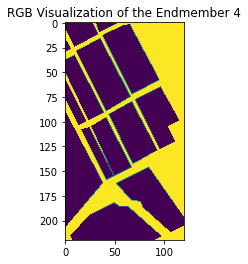

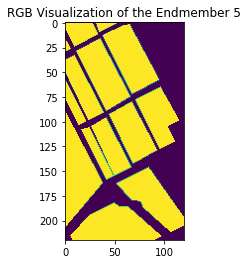

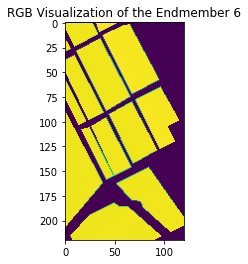

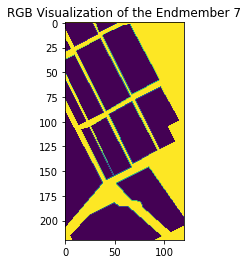

In [64]:
#Abudance maps
abudanceB=abudance_maps(thetaB)

#PLot the abudance maps
for i in range(7):
    fig=plt.figure()
    plt.imshow(abudanceB[:,:,i])
    plt.title('RGB Visualization of the Endmember '+str(i+1))
    plt.show()

(ii) Compute the reconstruction error (for each (non-zero class label) pixel yi compute the quantity ||𝒚𝑖 − 𝑋𝜽𝑖 || 2 and then take the average over those pixels).

In [65]:
#Calculate reconstruction error
errorB=recon_error(thetaB)
print('The reconstruction error is ',round(np.mean(errorB)))

The reconstruction error is  27716914773


(c) Least squares imposing the non-negativity constraint on the entries of θ

In [66]:
#Using nnls that has a non-negativity constraint on the entries of theta
from scipy.optimize import nnls

#Calculate theta
thetaC=[]
for i in range(pixels):
    thetaCval,res=nnls(X,y[:,i])
    thetaC.append(thetaCval)
thetaC=np.array(thetaC).T

(i) Derive the corresponding 7 abundance maps (one for each endmember/material)

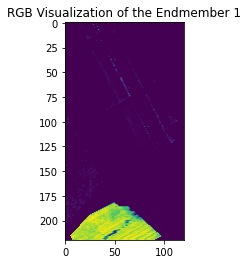

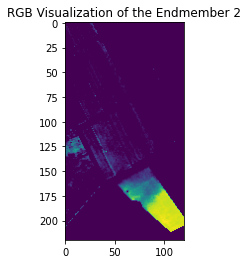

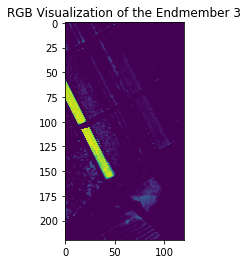

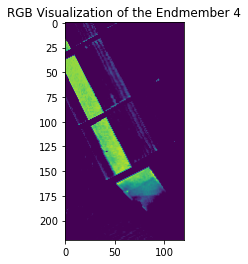

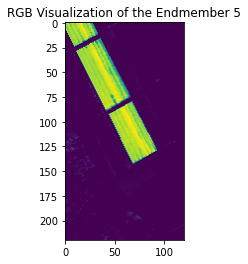

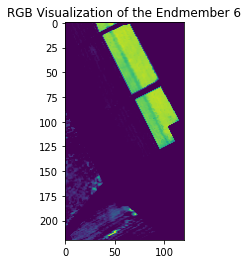

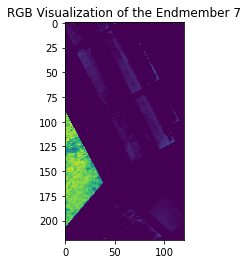

In [71]:
#Calcualte the abudance maps
abudanceC= abudance_maps(thetaC)

#Plot the abudance maps
for i in range(7):
    fig=plt.figure()
    plt.imshow(abudanceC[:,:,i])
    plt.title('RGB Visualization of the Endmember '+str(i+1))
    plt.show()

(ii) Compute the reconstruction error (for each (non-zero class label) pixel yi compute the quantity ||𝒚𝑖 − 𝑋𝜽𝑖 || 2 and then take the average over those pixels).

In [72]:
#Calculate reconstruction error
errorC=recon_error(thetaC)
print('The reconstruction error is ',round(np.mean(errorC)))

The reconstruction error is  156104


(d) Least squares imposing both the non-negativity and the sum-to-one constraint on
the entries of θ.

In [73]:
#Define the the function that needs to be minimised
def ls(x,a,b):
    return np.linalg.norm(a.dot(x)-b)

#Define the constraint (sum to one)
cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x)-1})

#Define the bounds (non negativity constraint)
bnds = [(0., 1) for x in thetaC[:,1]]

#Calculate theta
thetaD=[]
for i in range(pixels):
    Y=y[:,i]
    t=thetaC[:,i]
    thetaD.append(minimize(ls,args=(X,Y) ,x0=t,constraints=cons,bounds=bnds).x)
thetaD=np.array(thetaD).T

(i) Derive the corresponding 7 abundance maps (one for each endmember/material)

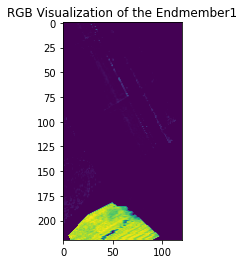

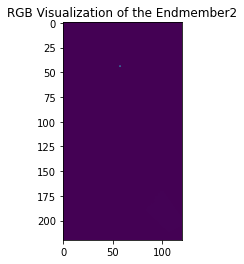

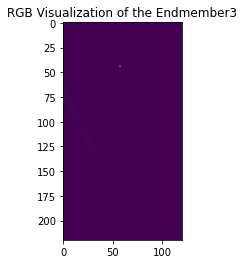

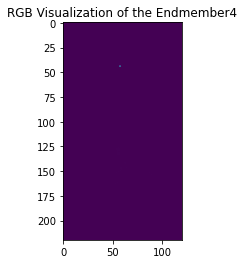

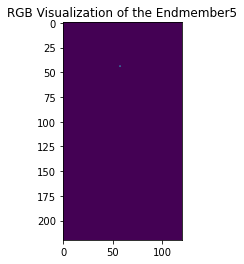

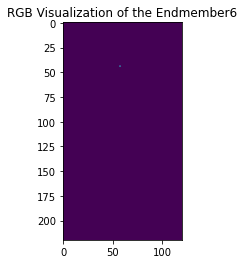

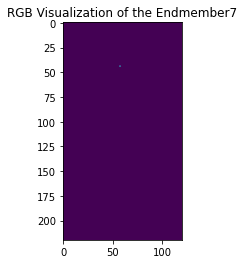

In [74]:
#Calculate abudance maps
abudanceD=abudance_maps(thetaD)

#Plot abudance maps
for i in range(7):
    fig=plt.figure()
    plt.imshow(abudanceD[:,:,i])
    plt.title('RGB Visualization of the Endmember'+str(i+1))
    plt.show()

(ii) Compute the reconstruction error (for each (non-zero class label) pixel yi compute the quantity ||𝒚𝑖 − 𝑋𝜽𝑖 || 2 and then take the average over those pixels).

In [75]:
#Calculate reconstruction error
errorD=recon_error(thetaD)
print('The reconstruction error is ',round(np.mean(errorD)))

The reconstruction error is  242598050250


(e) LASSO, i.e., impose sparsity on θ via 𝑙1 norm minimization

In [76]:
from sklearn import linear_model

#Calculate theta after testing for many different option for alpha,tol and max_iter 
thetalasso=[]
for i in range(pixels):
    Y=y[:,i]
    clf=linear_model.Lasso(alpha=0.1,max_iter=5000,fit_intercept=False,tol=1e-9)
    clf.fit(X,Y)
    thetalasso.append(clf.coef_)
thetalasso=np.array(thetalasso).T

C:\Users\sotir\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17455.931475631718, tolerance: 0.966117325
  model = cd_fast.enet_coordinate_descent(
C:\Users\sotir\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16133.04749995285, tolerance: 0.997572372
  model = cd_fast.enet_coordinate_descent(
C:\Users\sotir\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18537.397556732914, tolerance: 1.0092915500000001
  model = cd_fast.enet_coordinate_descent(
C:\Users\sotir\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Object

(i) Derive the corresponding 7 abundance maps (one for each endmember/material)

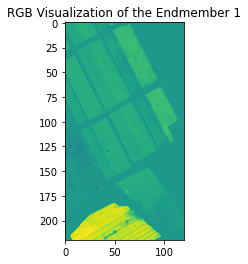

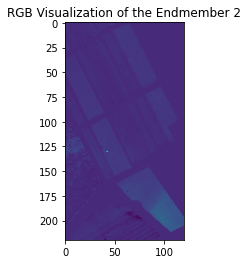

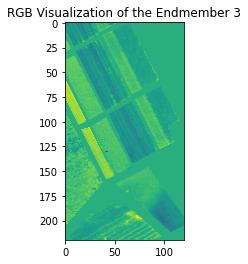

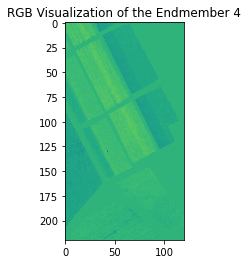

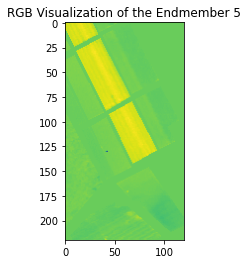

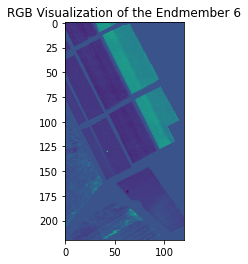

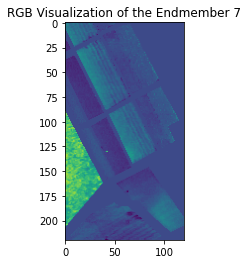

In [77]:
#Calculate abudance maps
abudancelasso=abudance_maps(thetalasso)

#Plot abudance maps
for i in range(7):
    fig=plt.figure()
    plt.imshow(abudancelasso[:,:,i])
    plt.title('RGB Visualization of the Endmember '+str(i+1))
    plt.show()

(ii) Compute the reconstruction error (for each (non-zero class label) pixel yi compute the quantity ||𝒚𝑖 − 𝑋𝜽𝑖 || 2 and then take the average over those pixels).

In [78]:
#Calculate reconstruction error
errorlasso=recon_error(thetalasso)
print('The reconstruction error is ',round(np.mean(errorlasso)))

The reconstruction error is  50182


RGB visualisation of the true labels

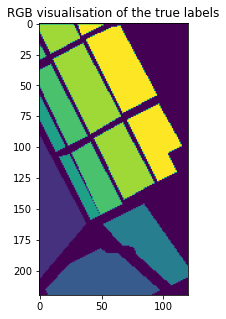

In [80]:
fig = plt.figure(figsize = (5,5))
plt.imshow(labels)
plt.title('RGB visualisation of the true labels')
plt.show()

(B)

Based on the reconstruction error the ordinary least squares has the highest error. When we apply the constraint sum to one for thetas then reconstruction error becomes smaller but still remains high. Regarding the non negative constraint of thetas, the reconstruction error becomes much smaller. The optimal method based on our findings is the Lasso method with a relatively small reconstruction error. Lastly, the combination of sum to one and non negative contraints does not give the results we expected as the coefficients are positive but do not sum exactly to 1. Therefore, we cannot obtain qualitive results. We also observe that the methods with high reconstruction error have abudance maps that do not provide any information about classes, as the pixels provide mixed results. On the contrary, the abudance maps of Lasso and non negative constraint provide useful information, pointing that the classes are distinguished better.

Part 2 (classification)

(A)

In [84]:
#Create the data sets 
ytrain=Training_Set[Training_Set!=0]
ytest=Test_Set[Test_Set!=0]
yoper=Operational_Set[Operational_Set!=0]
xtrain=HSI[Training_Set!=0]
xtest=HSI[Test_Set!=0]
xoper=HSI[Operational_Set!=0]

(i) The naïve Bayes classifier

In [85]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score

#Calculate validation error and standard deviation after 10-fold cross validation
clf=GaussianNB()
score=cross_val_score(clf,xtrain,ytrain,cv=10)
NBerror=1-score
NBerrormean=NBerror.mean()
NBerrorstd=NBerror.std()
print("Validation error ",NBerrormean,'and standard deviation ',NBerrorstd)

Validation error  0.026223969454143535 and standard deviation  0.016023209106526503


In [87]:
#Train the classifier to the whole training set
clf.fit(xtrain,ytrain)

#Predict the classes for test set
NBpred=clf.predict(xtest)

#Calculate confusion matrix and success rate
from sklearn.metrics import confusion_matrix
NBcm=confusion_matrix(ytest,NBpred)
print('Confusion Matrix \n',NBcm)
NBaccuracy=np.diag(NBcm).sum()/NBcm.sum()
print('The success rate is ',NBaccuracy)

Confusion Matrix 
 [[545   0   0   0   0   0   3]
 [  5 512   0   0   0   0   0]
 [  0   0 470   0  42   0   0]
 [  0   0   0 210   4   0   0]
 [  0   0  12   4 547   0   0]
 [  1   0   2   0   0 995   0]
 [  6   0   0   0   0   0 874]]
The success rate is  0.9813327032136105


All the classes seem to be seperated correctly by the classifier. There is only a small confusion of 12 values that were classified in class 3 instead of 5 and 42 values that were classified in class 5 instead of class 3.

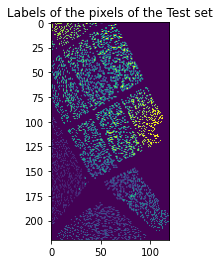

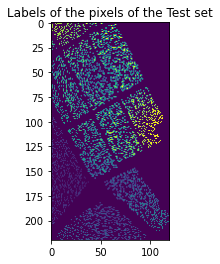

In [100]:
#Calculate and plot prediction and test classes 
predictions=np.zeros((220,120))
k=0
for i in range(220):
    for j in range(120):
        if Test_Set[i,j]!=0:
            predictions[i,j]=NBpred[k]
            k=k+1
            
fig = plt.figure()
plt.imshow(predictions)
plt.title('Labels of the pixels of the predicted classes')
plt.show()

fig = plt.figure()
plt.imshow(Test_Set)
plt.title('Labels of the pixels of the Test set classes')
plt.show()

In [88]:
#Predict the classes for the operational set
NBpredoper=clf.predict(xoper)

#Calculate confusion matrix and success rate
NBcmoper=confusion_matrix(yoper,NBpredoper)
print('Confusion Matrix \n',NBcmoper)
NBaccuracyoper=np.diag(NBcmoper).sum()/NBcmoper.sum()
print('The success rate is ',NBaccuracyoper)

Confusion Matrix 
 [[597   0   2   0   0   0   1]
 [  6 563   0   0   0   0   0]
 [  0   0 428   2  32   0   0]
 [  0   0   0 187   5   0   0]
 [  0   0   8   5 501   0   0]
 [  2   0   0   0   0 986   0]
 [  5   0   0   0   0   0 902]]
The success rate is  0.9839319470699432


All the classes seem to be seperated correctly by the classifier. There is only a small confusion of 32 values that were classified in class 5 instead of 4.

(ii) The minimum Euclidean distance classifier

In [89]:
from scipy.spatial import distance

#Define the minimum Euclidean distance classifier
def min_dist(xtrain,ytrain,xtest,ytest):
    m=[]
    for i in range(1,8):
        m.append(xtrain[ytrain==i].mean(axis=0))
    m=np.array(m)

    dist= distance.cdist(xtest,m,metric='euclidean')
    min_dist_pred=np.argmin(dist,axis=1)+1
    wrong=0
    for i in range(len(ytest)):
        if ytest[i]!=min_dist_pred[i]:
            wrong=wrong+1
    error=wrong/len(ytest)
    return min_dist_pred,error

#Calculate validation error and standard deviation after 10-fold cross validation
errors=[]
subx=np.array_split(xtrain,10)
suby=np.array_split(ytrain,10)
for i in range(10):
    subxtest=subx[i]
    subytest=suby[i]
    subxtrain=np.empty((0,204))
    subytrain=[]
    for j in range(10):
        if i!=j:
            subxtrain=np.vstack((subxtrain,subx[j]))
            subytrain=np.append(subytrain,suby[j])
    errors.append(min_dist(subxtrain,subytrain,subxtest,subytest)[1])

print('Validation error ',np.mean(errors),' and standard deviation ',np.std(errors))

Validation error  0.05507548544299028  and standard deviation  0.076823601071471


In [91]:
#Train the classifier to the whole training set
#Predict the classes for test set
min_dist_pred,error=min_dist(xtrain,ytrain,xtest,ytest)

#Calculate confusion matrix and success rate
Ecm=confusion_matrix(ytest,min_dist_pred)
print('Confusion Matrix \n',Ecm)
Eaccuracy=np.diag(Ecm).sum()/Ecm.sum()
print('The success rate is ',Eaccuracy)

Confusion Matrix 
 [[536   0   4   0   1   0   7]
 [  2 484   0   0   0   0  31]
 [  0   0 417   0  95   0   0]
 [  0   0   0 212   2   0   0]
 [  0   0  16   4 543   0   0]
 [  0   0   6   0   0 992   0]
 [  5   0   0   0   0   0 875]]
The success rate is  0.9591209829867675


All the classes seem to be seperated correctly by the classifier. There is only a small confusion of 31 values that were classified in class 7 instead of 1 and another 95 values classified in class 5 instead of class 3.

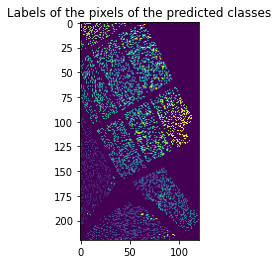

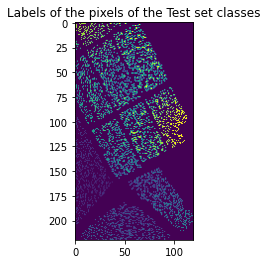

In [101]:
#Calculate and plot prediction and test classes 
predictions=np.zeros((220,120))
k=0
for i in range(220):
    for j in range(120):
        if Test_Set[i,j]!=0:
            predictions[i,j]=min_dist_pred[k]
            k=k+1
            
fig = plt.figure()
plt.imshow(predictions)
plt.title('Labels of the pixels of the predicted classes')
plt.show()

fig = plt.figure()
plt.imshow(Test_Set)
plt.title('Labels of the pixels of the Test set classes')
plt.show()

In [92]:
#Predict the classes for the operational set
Epredoper,error=min_dist(xtrain,ytrain,xoper,yoper)

#Calculate confusion matrix and success rate
Ecmoper=confusion_matrix(yoper,Epredoper)
print('Confusion Matrix \n',Ecmoper)
Eaccuracyoper=np.diag(Ecmoper).sum()/Ecmoper.sum()
print('The success rate is ',Eaccuracyoper)

Confusion Matrix 
 [[587   0   9   0   0   0   4]
 [  2 524   0   0   0   0  43]
 [  0   0 371   2  89   0   0]
 [  0   0   0 190   2   0   0]
 [  0   0  11   4 499   0   0]
 [  0   0   5   0   0 981   2]
 [  4   1   0   0   0   0 902]]
The success rate is  0.9579395085066162


All the classes seem to be seperated correctly by the classifier. There is only a small confusion of 43 values that were classified in class 7 instead of 2 and another 89 values classified in class 5 instead of class 3.

(iii) The k-nearest neighbor classifier

In [93]:
from sklearn.neighbors import KNeighborsClassifier

#Calculate validation error and standard deviation after 10-fold cross validation
knn=KNeighborsClassifier(n_neighbors=1,p=1)
score=cross_val_score(knn,xtrain,ytrain,cv=10)
knnerror=1-score
knnerrormean=knnerror.mean()
knnerrorstd=knnerror.std()
print("Validation error ",knnerrormean,'and standard deviation ',knnerrorstd)

Validation error  0.0072078898964779035 and standard deviation  0.010980098008342933


In [94]:
#Train the classifier to the whole training set
knn.fit(xtrain,ytrain)

#Predict the classes for test set
knnpred=knn.predict(xtest)

#Calculate confusion matrix and success rate
knncm=confusion_matrix(ytest,knnpred)
print('Confusion Matrix \n',knncm)
knnaccuracy=np.diag(knncm).sum()/knncm.sum()
print('The success rate is ',knnaccuracy)

Confusion Matrix 
 [[548   0   0   0   0   0   0]
 [  0 516   0   0   0   0   1]
 [  0   0 512   0   0   0   0]
 [  0   0   0 213   1   0   0]
 [  0   0   1   1 558   3   0]
 [  0   0   0   0   0 998   0]
 [  0   0   0   0   0   0 880]]
The success rate is  0.9983459357277883


All the classes seem to be seperated correctly by the classifier.

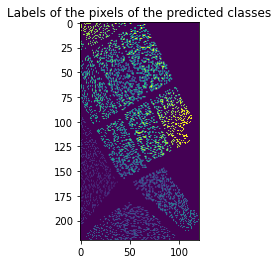

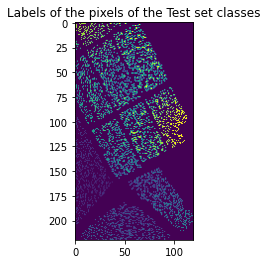

In [102]:
#Calculate and plot prediction and test classes 
predictions=np.zeros((220,120))
k=0
for i in range(220):
    for j in range(120):
        if Test_Set[i,j]!=0:
            predictions[i,j]=knnpred[k]
            k=k+1
            
fig = plt.figure()
plt.imshow(predictions)
plt.title('Labels of the pixels of the predicted classes')
plt.show()

fig = plt.figure()
plt.imshow(Test_Set)
plt.title('Labels of the pixels of the Test set classes')
plt.show()

In [95]:
#Predict the classes for the operational set
knnpredoper=knn.predict(xoper)

#Calculate confusion matrix and success rate
knncmoper=confusion_matrix(yoper,knnpredoper)
print('Confusion Matrix \n',knncmoper)
knnaccuracyoper=np.diag(knncmoper).sum()/knncmoper.sum()
print('The success rate is ',knnaccuracyoper)

Confusion Matrix 
 [[600   0   0   0   0   0   0]
 [  0 569   0   0   0   0   0]
 [  0   0 458   0   4   0   0]
 [  0   0   0 190   2   0   0]
 [  0   0   4   2 507   1   0]
 [  0   0   0   0   0 988   0]
 [  0   0   0   0   0   0 907]]
The success rate is  0.9969281663516069


All the classes seem to be seperated correctly by the classifier.

(iv) The Bayesian classifier

In [96]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

#Calculate validation error and standard deviation after 10-fold cross validation
B=QuadraticDiscriminantAnalysis()
score=cross_val_score(B,xtrain,ytrain,cv=10)
Berror=1-score
Berrormean=Berror.mean()
Berrorstd=Berror.std()
print("Validation error ",Berrormean,'and standard deviation ',Berrorstd)

Validation error  0.03426123629218406 and standard deviation  0.005850919532443715


In [97]:
#Train the classifier to the whole training set
B.fit(xtrain,ytrain)

#Predict the classes for test set
Bpred=B.predict(xtest)

#Calculate confusion matrix and success rate
Bcm=confusion_matrix(ytest,Bpred)
print('Confusion Matrix \n',Bcm)
Baccuracy=np.diag(Bcm).sum()/Bcm.sum()
print('The success rate is ',Baccuracy)

Confusion Matrix 
 [[548   0   0   0   0   0   0]
 [  0 517   0   0   0   0   0]
 [  0   0 512   0   0   0   0]
 [  0   0   0 125  89   0   0]
 [  0   0   3   0 558   2   0]
 [  0   0   0   0   0 998   0]
 [  0   0   0   0   0   0 880]]
The success rate is  0.9777882797731569


All the classes seem to be seperated correctly by the classifier. There is only a small confusion of 89 values that were classified in class 5 instead of 4.

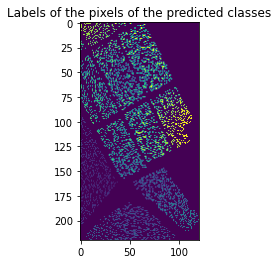

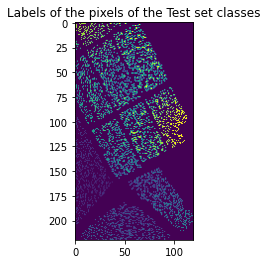

In [103]:
#Calculate and plot prediction and test classes 
predictions=np.zeros((220,120))
k=0
for i in range(220):
    for j in range(120):
        if Test_Set[i,j]!=0:
            predictions[i,j]=Bpred[k]
            k=k+1
            
fig = plt.figure()
plt.imshow(predictions)
plt.title('Labels of the pixels of the predicted classes')
plt.show()

fig = plt.figure()
plt.imshow(Test_Set)
plt.title('Labels of the pixels of the Test set classes')
plt.show()

In [99]:
#Predict the classes for the operational set
Bpredoper=knn.predict(xoper)

#Calculate confusion matrix and success rate
Bcmoper=confusion_matrix(yoper,Bpredoper)
print('Confusion Matrix \n',Bcmoper)
Baccuracyoper=np.diag(Bcmoper).sum()/Bcmoper.sum()
print('The success rate is ',Baccuracyoper)

Confusion Matrix 
 [[600   0   0   0   0   0   0]
 [  0 569   0   0   0   0   0]
 [  0   0 458   0   4   0   0]
 [  0   0   0 190   2   0   0]
 [  0   0   4   2 507   1   0]
 [  0   0   0   0   0 988   0]
 [  0   0   0   0   0   0 907]]
The success rate is  0.9969281663516069


All the classes seem to be seperated correctly by the classifier. 

(B)

We observe that all the classifiers have a success rate above 95.7%.Hence, the results seem really promising as it can be seen from the depiction of the predicted classes. The classification errors and standard deviation are relatively small. The worst classifier out of four is the minimum Euclidean distance with 95.7% success rate followed by Naive Bayess classifier with 98.39%. The KNN classifier and Bayess Classifier have the best performance with 99.69%. The confussion matrices show that the most common wrong classification is in class 5 instead of 3. However, most non diagonial values are close to zero. Especially the best two classifiers do not seem to to provide any significant wrong classifications.

Part 3 (combination)

In the spectral unmixing, we calculated the percentage to which each pure material contributes in its formation as the spectral unmixing U provides sub-pixel information for a given pixel.
In the supervised classification each pixel is classified to a class.
The results from the two methods should agree with each other. In the spectral unmixing the material with the highest percentage should agree with the material that classification method produced.
Hence, if we look at the results of our best models in each method (Lasso and knn or Bayes classifiers) the results should correlate with each other based on the visualisation.
Lastly, each method should be used in a problem like this, as each method provides usefull information. The results of one method can be reinforced by the other method, especially if the majority of the pixels are mixed pixels.